Bayes Rule Book:

https://www.bayesrulesbook.com/chapter-17.html

Materials from the Bayes Rule github:

https://github.com/bayes-rules/bayesrules

# Imports

In [1]:
import math, pyreadr
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from os.path import exists

import pyro
import torch as t
import pyro.distributions as dist
from pyro.infer import MCMC
from pyro.infer.mcmc.nuts import NUTS

# Hierarchical Models With Predictors

Runner dataset showing marathon times for multiple runners over consecutive years.

## Data

In [2]:
file_name = 'cherry_blossom_sample'
folder    = 'ch17'

data_url = f"https://github.com/bayes-rules/bayesrules/raw/master/data/{file_name}.rda"

if exists(f"/Users/zr/Geek/tutorials/bayesian_rules/{folder}/{file_name}.csv"):
    df = pd.read_csv(f"/Users/zr/Geek/tutorials/bayesian_rules/{folder}/{file_name}.csv")
    df = df.drop(columns=['Unnamed: 0'])
else:
    # pyreadr downloads remote file, saves locally and converts the RDA datafile to a pandas DataFrame
    file_path = f"/Users/zr/Geek/tutorials/bayesian_rules/{folder}/{file_name}.rda"
    pyreadr.download_file(data_url, file_path)
    result = pyreadr.read_r(file_path)
    df = result[file_name]
    df.to_csv(f"/Users/zr/Geek/tutorials/bayesian_rules/{folder}/{file_name}.csv")

In [3]:
df = df[['runner', 'age', 'net']].dropna()

In [4]:
df

,runner,age,net
0,1,53,83.983333
1,1,54,74.300000
2,1,55,75.150000
3,1,56,74.216667
4,1,57,74.250000
...,...,...,...
244,35,59,87.150000
246,36,53,105.750000
247,36,54,103.016667
248,36,56,105.416667


*...skipping pooled and non-pooled examples are going straight to the semi-pooled section...*

## Model

We start with:

- $Y_{ij}|\mu_j,\sigma_y \sim N(\mu_j, \sigma_y)~~$ *model of running times **within** runner $j$*
- $\mu_j|\mu,\sigma_{\mu} \sim N(\mu, \sigma_{\mu})~~~~~$ *model of variance **between** runners*
- $\mu,\sigma_y,\sigma_{\mu} \sim ...~~~~~~~~~~~~~~$ *our global priors*

Breaking down each layer individually:

### Layer 1: Variability of a specific runner

We want to incorporate our predictor, `age` into the mix. We can do this by setting our input mean param, $\mu_j = \beta_{0j}+\beta_1X_{ij}$

*NOTE: (per book) the subscript of our intercept term, $\beta_{0j}$ means it is local to the group $j$ while $\beta_1$ is shared amongst all groups. Effectively, this means we assume that the change in net time over age is consistent (though variability is group-dependent), each runner is just starting from a different point.* 

### Layer 2: Variability amongst runners

> It’s important to recognize here that our 36 sample runners are drawn from the same broader population of runners. Thus, instead of taking a no pooling approach, which assigns each $\beta_{0j}$ a unique prior, and hence assumes that one runner $j$ can’t tell us about another, these intercepts should share a prior. To this end we’ll assume that the runner-specific intercept parameters, and hence baseline running speeds, vary normally around some mean $\beta_0$ with standard deviation $\sigma_0$:

- $\beta_{0j}|\beta_0,\sigma_0 \sim N(\beta_0,\sigma_0)$

Here, $\beta_0$ and $\sigma_0$ are global priors

## Layer 3: Global Priors

Here is the list of priors we need to define:

|prior|description|
|:-|:-|
|$\beta_0$      | What we believe the average running time is across the sampled population|
|$\sigma_0$     | Our certainty about how the runners will conform to that mean|
|$\beta_1$      | Our initial guess at the effect of age on time|
|$\sigma_{y}$   | Our guess of the variability within a runner|

### Updated Model with predictor

- $Y_{ij}|\beta_{0j},\beta_1,\sigma_y \sim N(\mu_{ij}, \sigma_y)$ with $\mu_j = \beta_{0j}+\beta_1X_{ij}~~$ *regression of running times **within** runner $j$*
- $\beta_{0j}|\beta_0,\sigma_0 \sim N(\beta_0,\sigma_0)~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~$ *baseline variability **between** runners*
<br /><br />
- $\beta_0 \sim N(m_0, s_0)$
- $\beta_1 \sim N(m_1, s_1)~~~~~~~~~~~~~~$ *Global Priors*
- $\sigma_0 \sim Exp(l_0)$
- $\sigma_y \sim Exp(l_y)$

### Tuning the priors

In [5]:
b0_mean = df.net.mean() #89.95
b0_std  = df.net.std() #13.98

age_net_means  = df[['age', 'net']].groupby('age').mean()
age_net_slopes = np.array([(age_net_means.loc[i].values[0] - age_net_means.loc[i-1].values[0]) for i in age_net_means.index[1:]])
b1_mean = age_net_slopes.mean() #0.874
b1_std  = age_net_slopes.std() #4.25

# from book, just using weak priors for l0 and l1
ly = 0.072
l0 = 1.


### Building the Model

In [6]:
runner_ids  = t.tensor(pd.to_numeric(df.runner).values - 1, dtype=t.long)
runner_ages = t.tensor(df.age.values, dtype=t.float)
runner_nets = t.tensor(df.net.values, dtype=t.float)

#### With global slope

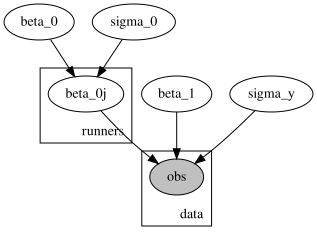

In [9]:
def model(runner_ids, ages, run_times=None):
    beta_0  = pyro.sample('beta_0', dist.Normal(b0_mean, b0_std))
    sigma_0 = pyro.sample('sigma_0', dist.Exponential(l0))

    with pyro.plate('runners', df.runner.nunique()):
        beta_0j = pyro.sample('beta_0j', dist.Normal(beta_0, sigma_0))

    beta_1    = pyro.sample('beta_1', dist.Normal(b1_mean, b1_std))
    sigma_y   = pyro.sample('sigma_y', dist.Exponential(ly))

    runner_mu = beta_0j[runner_ids] + beta_1*ages

    with pyro.plate('data', len(runner_ids)):
        return pyro.sample('obs', dist.Normal(runner_mu, sigma_y), obs=run_times)

pyro.render_model(model, model_args=(runner_ids, runner_ages, runner_nets))

In [10]:
pyro.clear_param_store
mcmc = MCMC(NUTS(model), 2000, warmup_steps=500)
mcmc.run(runner_ids, runner_ages, runner_nets)
mcmc.summary()

Sample: 100%|██████████| 2500/2500 [05:34,  7.47it/s, step size=3.11e-02, acc. prob=0.935]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
     beta_0     50.08      8.78     49.49     37.50     64.87     26.12      1.02
 beta_0j[0]     36.23      9.01     35.73     22.91     50.94     27.06      1.02
 beta_0j[1]     44.17      8.84     43.55     31.31     59.11     27.14      1.02
 beta_0j[2]     50.22      8.73     49.83     38.00     64.96     27.12      1.02
 beta_0j[3]     61.55      9.01     61.15     48.99     77.59     27.20      1.02
 beta_0j[4]     36.96      8.79     36.55     24.20     50.95     27.20      1.02
 beta_0j[5]     34.98      9.62     34.34     21.49     52.12     27.13      1.02
 beta_0j[6]     61.75      8.66     61.18     48.66     75.86     27.96      1.02
 beta_0j[7]     62.85      9.00     62.45     50.25     78.62     27.95      1.02
 beta_0j[8]     57.85      9.32     57.34     43.72     73.02     26.72      1.02
 beta_0j[9]     74.86      9.15     74.34     61.70     90.25     27.25      1.02
beta_0j[10]    

In [11]:
samples = mcmc.get_samples()

beta_0j_samples = samples['beta_0j'][-50:,:].numpy()
beta_1_samples  = samples['beta_1'][-50:].numpy()
sigma_y_samples = samples['sigma_y'][-50:].numpy()

ages = np.tile(np.arange(df.age.min(), df.age.max()+1), 50).reshape((50,12))

# shape: (50, 36, 12) -> 50 samples, 36 runners, 12 ages
obs_samples = (beta_0j_samples.reshape((50, 36,1)) + np.tile((beta_1_samples[:,None] * ages),36).reshape((50,36,12)))

In [12]:
# By Runner (overall)
fig = ff.create_distplot(
    [obs_samples[:, runner_id-1, :].flatten() for runner_id in df.runner.unique().astype(int)], 
    [f'runner {id}' for id in df.runner.unique()], 
    show_rug=False
)
fig.update_layout(title_text='By Runner')
fig

In [13]:
# By Age
fig = ff.create_distplot(
    [obs_samples[:, :, i].flatten() for i in range(df.age.nunique())], 
    [f'age {age}' for age in df.age.unique()], 
    show_rug=False
)
fig.update_layout(title_text='By Age')
fig

In [14]:
dist_data = []
dist_labels = []
for id in df.runner.unique():
    dist_data.append(df.loc[df.runner==id, 'net'])
    dist_data.append(obs_samples[:,int(id)-1,:].flatten())
    dist_labels.extend([f'{id}_act',f'{id}_pred'])

dist_fig = ff.create_distplot(dist_data, dist_labels, show_rug=False)
dist_fig

In [15]:
fig = make_subplots(rows=df.runner.nunique()//2, cols=2, subplot_titles=[f'runner_{i}' for i in range(df.runner.nunique())], horizontal_spacing=.03, vertical_spacing=.015)

for i in range(0, df.runner.nunique()*2, 2):
    id = i//2
    fig.add_trace(go.Histogram(dist_fig['data'][i]),   row=(id//2)+1, col=(id%2)+1)
    fig.add_trace(go.Scatter(dist_fig['data'][i+72]),  row=(id//2)+1, col=(id%2)+1)

    fig.add_trace(go.Histogram(dist_fig['data'][i+1]), row=(id//2)+1, col=(id%2)+1)
    fig.add_trace(go.Scatter(dist_fig['data'][i+73]),  row=(id//2)+1, col=(id%2)+1)

fig.update_layout(height=22*300)
fig

In [22]:
fig = make_subplots(rows=36//2, cols=2, subplot_titles=[f'runner_{i+1}' for i in range(36)], vertical_spacing=.01)

for row, runner_data in enumerate(obs_samples.mean(axis=0)):
    fig.add_trace(
        go.Scatter(x=np.arange(50, 62),y=runner_data), row=(row//2)+1, col=(row%2)+1
    )
    runner_df = df.loc[df.runner==row+1, ['age','net']]
    fig.add_trace(
        go.Scatter(x=runner_df.age, y=runner_df.net, mode='markers'), row=(row//2)+1, col=(row%2)+1
    )

fig.update_layout(height=(36//2)*200)
fig

#### With individual slope

The above model assumes our intercept, $\beta_0$ is local while all runners share the same slope, $\beta_1$. While somewhat true that runners tend to slow as they age, the rate of slowing is likely different for each runner. 

In this updated model, we will make our slope, $\beta_1$ local.

- $Y_{ij}|\beta_{0j},\beta_1,\sigma_y \sim N(\mu_{ij}, \sigma_y)$ with $\mu_j = \beta_{0j}+\beta_{1j}X_{ij}~~$ *regression of running times **within** runner $j$*
- $\begin{pmatrix}\beta_{0j}\\\beta_{1j}\end{pmatrix}|\beta_0,\beta_1,\sigma_0,\sigma_1 \sim MVN((\beta_0,\beta_1),\Sigma)~~~~~~~~~~~~~~~~~~~$
<br /><br />
- $\beta_0 \sim N(m_0, s_0)$
- $\beta_1 \sim N(m_1, s_1)~~~~~~~~~~~~~~$ *Global Priors*
- $\sigma_y \sim Exp(l_y)$
- $\Sigma \sim$ *Joint prior to express our understanding of how the combined $\sigma_0, \sigma_1, \rho$ parameters define covariance matrix $\Sigma$ via "decomposition of covariance"*

##### Aside: Decomposition of Covariance

$\Sigma = \begin{pmatrix} \sigma_0^2 & \rho \sigma_0 \sigma_1 \\ \rho \sigma_0 \sigma_1  & \sigma_1^2 \end{pmatrix}$ 

- $R = \begin{pmatrix} 1 & \rho \\ \rho & 1 \end{pmatrix}~~~~~~~~~~~~~~~~~~~~~~$ *correlation matrix*
- $\tau = \sqrt{\sigma_0^2 \sigma_1^2}~~~~~~~~~~~~~~~~~~~~~~~~~$ *prior information about the total degree to which the intercepts and slopes vary by runner*
- $\pi = \begin{pmatrix} \pi_0 \\ \pi_1 \end{pmatrix} = \begin{pmatrix} \frac{\sigma_0^2}{\sigma_0^2+\sigma_1^2} \\ \frac{\sigma_1^2}{\sigma_0^2+\sigma_1^2} \end{pmatrix}~~~~$ *the relative proportion of the variability between runners that’s due to differing intercepts*

Expressing $\Sigma$ in terms of $R,\tau,\pi$:

$\begin{pmatrix} \sigma_0^2 & \rho \sigma_0 \sigma_1 \\ \rho \sigma_0 \sigma_1  & \sigma_1^2 \end{pmatrix} = \begin{pmatrix} \sigma_0 & 0 \\ 0 & \sigma_1 \end{pmatrix} \begin{pmatrix} 1 & \rho \\ \rho & 1 \end{pmatrix}\begin{pmatrix} \sigma_0 & 0 \\ 0 & \sigma_1 \end{pmatrix}$

$\begin{pmatrix} \sigma_0 \\ \sigma_1 \end{pmatrix}=\tau\sqrt{\pi}$

##### Back to modeling

In [80]:
sigma_0 = pyro.sample('sigma_0', dist.Exponential(l0).expand([2])).detach()
sigma_0

tensor([0.0325, 0.2540])

In [78]:
t.stack([sigma_0, sigma_0])

tensor([[0.6072, 1.0887],
        [0.6072, 1.0887]])

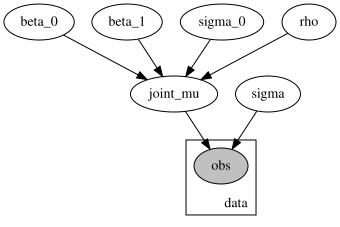

In [81]:
# With help from https://fehiepsi.github.io/rethinking-numpyro/14-adventures-in-covariance.html#Code-14.12

def model(runner_ids, ages, run_times=None):
    beta_0  = pyro.sample('beta_0', dist.Normal(b0_mean, b0_std))
    beta_1  = pyro.sample('beta_1', dist.Normal(b1_mean, b1_std))

    # Joint prior to express our understanding of how the combined σ_0, σ_1, and ρ parameters define covariance matrix Σ
    sigma_y = pyro.sample('sigma_0', dist.Exponential(l0).expand([2]))
    rho = pyro.sample('rho', dist.LKJ(2,2))
    cov = t.outer(sigma_y, sigma_y) * rho

    joint_mu = pyro.sample('joint_mu', dist.MultivariateNormal(t.stack([beta_0, beta_1]), cov).expand([df.runner.nunique()]))
    beta_0j, beta_1j = joint_mu[:, 0], joint_mu[:, 1]

    runner_mu = beta_0j[runner_ids] + beta_1j[runner_ids]*ages
    sigma   = pyro.sample('sigma', dist.Exponential(ly))

    with pyro.plate('data', len(runner_ids)):
        return pyro.sample('obs', dist.Normal(runner_mu, sigma), obs=run_times)

pyro.render_model(model, model_args=(runner_ids, runner_ages, runner_nets))

In [82]:
pyro.clear_param_store
mcmc = MCMC(NUTS(model), 2000, warmup_steps=500)
mcmc.run(runner_ids, runner_ages, runner_nets)
mcmc.summary()

Warmup:   1%|          | 14/2500 [00:01,  6.59it/s, step size=4.49e-02, acc. prob=0.851]

In [38]:
beta_0j_samples = samples['joint_mu'][-50:,:,0].numpy().reshape((50,36,1))
beta_1j_samples = samples['joint_mu'][-50:,:,1].numpy().reshape((50,36,1))

ages = np.tile(np.arange(df.age.min(), df.age.max()+1), 36).reshape((36,12))
obs_samples = (beta_0j_samples + beta_1j_samples * ages )

In [39]:
# By Runner (overall)
fig = ff.create_distplot(
    [obs_samples[:, runner_id-1, :].flatten() for runner_id in df.runner.unique().astype(int)], 
    [f'runner {id}' for id in df.runner.unique()], 
    show_rug=False
)
fig.update_layout(title_text='By Runner')
fig

In [40]:
# By Age
fig = ff.create_distplot(
    [obs_samples[:, :, i].flatten() for i in range(df.age.nunique())], 
    [f'age {age}' for age in df.age.unique()], 
    show_rug=False
)
fig.update_layout(title_text='By Age')
fig

In [41]:
dist_data = []
dist_labels = []
for id in df.runner.unique():
    dist_data.append(df.loc[df.runner==id, 'net'])
    dist_data.append(obs_samples[:,int(id)-1,:].flatten())
    dist_labels.extend([f'{id}_act',f'{id}_pred'])

dist_fig = ff.create_distplot(dist_data, dist_labels, show_rug=False)
dist_fig

In [42]:
fig = make_subplots(rows=df.runner.nunique()//2, cols=2, subplot_titles=[f'runner_{i}' for i in range(df.runner.nunique())], horizontal_spacing=.03, vertical_spacing=.015)

for i in range(0, df.runner.nunique()*2, 2):
    id = i//2
    fig.add_trace(go.Histogram(dist_fig['data'][i]),   row=(id//2)+1, col=(id%2)+1)
    fig.add_trace(go.Scatter(dist_fig['data'][i+72]),  row=(id//2)+1, col=(id%2)+1)

    fig.add_trace(go.Histogram(dist_fig['data'][i+1]), row=(id//2)+1, col=(id%2)+1)
    fig.add_trace(go.Scatter(dist_fig['data'][i+73]),  row=(id//2)+1, col=(id%2)+1)

fig.update_layout(height=22*300)
fig

In [43]:
fig = make_subplots(rows=36//2, cols=2, subplot_titles=[f'runner_{i+1}' for i in range(36)], vertical_spacing=.01)

for row, runner_data in enumerate(obs_samples.mean(axis=0)):
    fig.add_trace(
        go.Scatter(x=np.arange(50, 62),y=runner_data), row=(row//2)+1, col=(row%2)+1
    )
    runner_df = df.loc[df.runner==row+1, ['age','net']]
    fig.add_trace(
        go.Scatter(x=runner_df.age, y=runner_df.net, mode='markers'), row=(row//2)+1, col=(row%2)+1
    )

fig.update_layout(height=(36//2)*200)
fig